/usr/local/lib/python3.10/dist-packages/matplotlib/animation.py:884: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


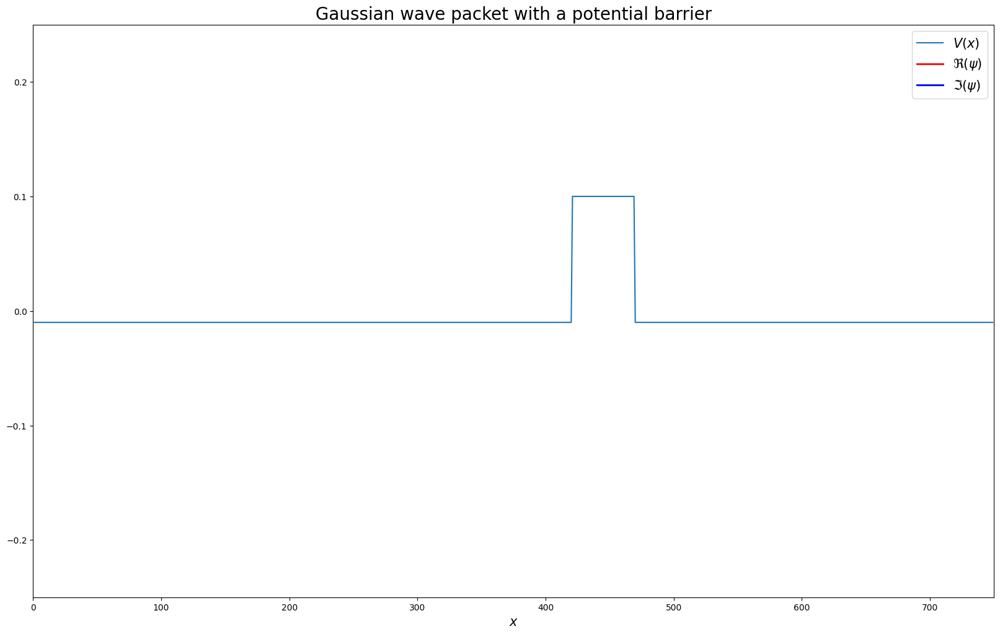

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def integral(f, dx, axis=0):
    return np.sum(f * dx, axis=axis)

def initialize_wave(N_grid, L, a, V0, w, x0, k0, sigma):
    x = np.linspace(0, L, N_grid + 1)
    dx = x[1] - x[0]  # grid point spacing

    # Initial wave function
    psi0 = np.exp(-1/2 * (x[1:-1] - x0)**2 / sigma**2) * np.exp(1j * k0 * x[1:-1])

    # Normalize the initial state
    norm = integral(np.abs(psi0)**2, dx)
    psi0 = psi0 / np.sqrt(norm)

    # Kinetic energy
    T = -1/2 * 1/dx**2 * (np.diag(-2*np.ones(N_grid-1)) + np.diag(np.ones(N_grid-2), 1) + np.diag(np.ones(N_grid-2), -1))

    # Potential as a flat array
    V_flat = np.array([V0 if a < pos < a + w else -0.01 for pos in x[1:-1]])

    # Potential energy as a diagonal matrix
    V = np.diag(V_flat)

    # Hamiltonian
    H = T + V

    return x, dx, psi0, H, V_flat

def solve_eigen(H, dx, psi0, N_grid):
    # Get eigenvalues and eigenvectors and normalize
    E, psi = np.linalg.eigh(H)
    psi = psi.T
    norm = integral(np.abs(psi)**2, dx)
    psi = psi / np.sqrt(norm)

    # Get expansion coefficients
    c_n = np.zeros_like(psi[0], dtype=complex)
    for j in range(0, N_grid-1):
        c_n[j] = integral(np.conj(psi[j]) * psi0, dx)

    return E, psi, c_n

def Psi(t, psi, c_n, E):
    return psi.T @ (c_n * np.exp(-1j * E * t))

def animate_wave(N_grid, L, a, V0, w, x0, k0, sigma, t):
    x, dx, psi0, H, V_flat = initialize_wave(N_grid, L, a, V0, w, x0, k0, sigma)
    E, psi, c_n = solve_eigen(H, dx, psi0, N_grid)

    fig = plt.figure(figsize=(20, 12))
    ax = plt.axes(xlim=(0, L), ylim=(-0.25, 0.25))
    ax.plot(x[1:-1], V_flat, label='$V(x)$')
    ax.set_title('Gaussian wave packet with a potential barrier', fontsize=20)
    line1, = ax.plot(x[1:-1], np.zeros(N_grid-1), lw=2, color="red", label='$\\Re(\\psi)$')
    line2, = ax.plot(x[1:-1], np.zeros(N_grid-1), lw=2, color="blue", label='$\\Im(\\psi)$')
    ax.legend(fontsize=15)
    ax.set_xlabel('$x$', fontsize=15)

    def animate(t):
        y1 = np.real(Psi(t, psi, c_n, E))
        y2 = np.imag(Psi(t, psi, c_n, E))
        line1.set_data(x[1:-1], y1)
        line2.set_data(x[1:-1], y2)
        return line1, line2,

    def init():
        line1.set_data([], [])
        line2.set_data([], [])
        return line1, line2,

    ani = FuncAnimation(fig, animate, frames=len(t), init_func=init, interval=20, blit=False)

    return ani

# Parameters
N_grid = 750
L = 750
a = 420
V0 = 0.1
w = 50
x0 = 100
k0 = 0.4
sigma = 15
t = np.linspace(0., 2500, 1000)

# Run animation
ani = animate_wave(N_grid, L, a, V0, w, x0, k0, sigma, t)
HTML(ani.to_html5_video())


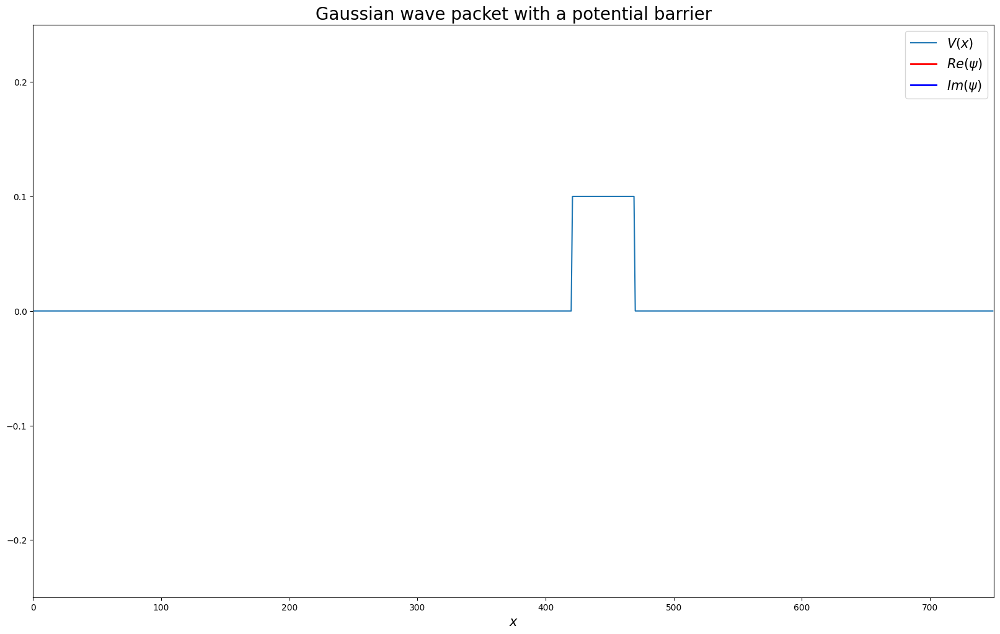

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def integral(f, dx, axis=0):
    return np.sum(f * dx, axis=axis)

def initialize_wave(N_grid, L, a, V0, w, x0, k0, sigma):
    x = np.linspace(0, L, N_grid + 1)
    dx = x[1] - x[0]  # grid point spacing

    # Initial wave function
    psi0 = np.exp(-1/2 * (x[1:-1] - x0)**2 / sigma**2) * np.exp(1j * k0 * x[1:-1])

    # Normalize the initial state
    norm = integral(np.abs(psi0)**2, dx)
    psi0 = psi0 / np.sqrt(norm)

    # Kinetic energy
    T = -1/2 * 1/dx**2 * (np.diag(-2*np.ones(N_grid-1)) + np.diag(np.ones(N_grid-2), 1) + np.diag(np.ones(N_grid-2), -1))

    # Potential as a flat array
    V_flat = np.array([V0 if a < pos < a + w else 0 for pos in x[1:-1]])

    # Potential energy as a diagonal matrix
    V = np.diag(V_flat)

    # Hamiltonian
    H = T + V

    return x, dx, psi0, H, V_flat

def solve_eigen(H, dx, psi0, N_grid):
    # Get eigenvalues and eigenvectors and normalize
    E, psi = np.linalg.eigh(H)
    psi = psi.T
    norm = integral(np.abs(psi)**2, dx)
    psi = psi / np.sqrt(norm)

    # Get expansion coefficients
    c_n = np.zeros_like(psi[0], dtype=complex)
    for j in range(0, N_grid-1):
        c_n[j] = integral(np.conj(psi[j]) * psi0, dx)

    return E, psi, c_n

def Psi(t, psi, c_n, E):
    return psi.T @ (c_n * np.exp(-1j * E * t))

def animate_wave(N_grid, L, a, V0, w, x0, k0, sigma, t):
    x, dx, psi0, H, V_flat = initialize_wave(N_grid, L, a, V0, w, x0, k0, sigma)
    E, psi, c_n = solve_eigen(H, dx, psi0, N_grid)

    fig = plt.figure(figsize=(20, 12))
    ax = plt.axes(xlim=(0, L), ylim=(-0.25, 0.25))
    ax.plot(x[1:-1], V_flat, label='$V(x)$')
    ax.set_title('Gaussian wave packet with a potential barrier', fontsize=20)
    line1, = ax.plot(x[1:-1], np.zeros(N_grid-1), lw=2, color="red", label='$\\Re(\\psi)$')
    line2, = ax.plot(x[1:-1], np.zeros(N_grid-1), lw=2, color="blue", label='$\\Im(\\psi)$')
    ax.legend(fontsize=15)
    ax.set_xlabel('$x$', fontsize=15)

    def animate(t):
        y1 = np.real(Psi(t, psi, c_n, E))
        y2 = np.imag(Psi(t, psi, c_n, E))
        line1.set_data(x[1:-1], y1)
        line2.set_data(x[1:-1], y2)
        return line1, line2,

    def init():
        line1.set_data([], [])
        line2.set_data([], [])
        return line1, line2,

    ani = FuncAnimation(fig, animate, frames=len(t), init_func=init, interval=20, blit=False)

    return ani

# Parameters
N_grid = 750
L = 750
a = 420
V0 = 0.1
w = 50
x0 = 100
k0 = 0.4
sigma = 15
t = np.linspace(0., 2500, 1000)

# Run animation
ani = animate_wave(N_grid, L, a, V0, w, x0, k0, sigma, t)
HTML(ani.to_html5_video())


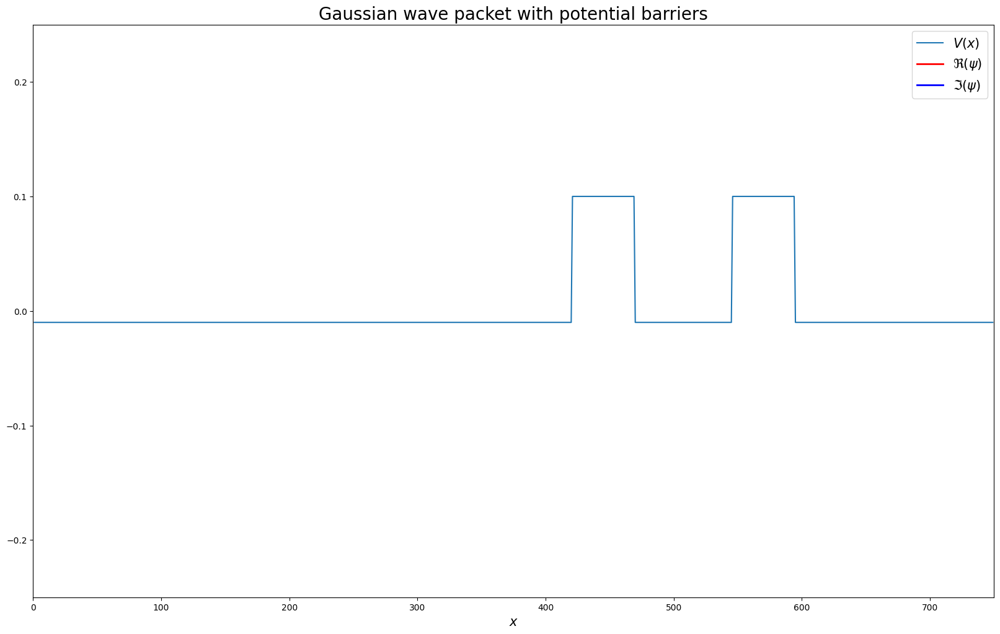

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def integral(f, dx, axis=0):
    return np.sum(f * dx, axis=axis)

def initialize_wave(N_grid, L, a, V0, w, x0, k0, sigma):
    x = np.linspace(0, L, N_grid + 1)
    dx = x[1] - x[0]  # grid point spacing

    # Initial wave function
    psi0 = np.exp(-1/2 * (x[1:-1] - x0)**2 / sigma**2) * np.exp(1j * k0 * x[1:-1])

    # Normalize the initial state
    norm = integral(np.abs(psi0)**2, dx)
    psi0 = psi0 / np.sqrt(norm)

    # Kinetic energy
    T = -1/2 * 1/dx**2 * (np.diag(-2*np.ones(N_grid-1)) + np.diag(np.ones(N_grid-2), 1) + np.diag(np.ones(N_grid-2), -1))

    # Potential as a flat array
    V_flat = np.array([V0 if (a < pos < a + w) or (a + 125 < pos < a + 125 + w) else -0.01 for pos in x[1:-1]])

    # Potential energy as a diagonal matrix
    V = np.diag(V_flat)

    # Hamiltonian
    H = T + V

    return x, dx, psi0, H, V_flat

def solve_eigen(H, dx, psi0, N_grid):
    # Get eigenvalues and eigenvectors and normalize
    E, psi = np.linalg.eigh(H)
    psi = psi.T
    norm = integral(np.abs(psi)**2, dx)
    psi = psi / np.sqrt(norm)

    # Get expansion coefficients
    c_n = np.zeros_like(psi[0], dtype=complex)
    for j in range(0, N_grid-1):
        c_n[j] = integral(np.conj(psi[j]) * psi0, dx)

    return E, psi, c_n

def Psi(t, psi, c_n, E):
    return psi.T @ (c_n * np.exp(-1j * E * t))

def animate_wave(N_grid, L, a, V0, w, x0, k0, sigma, t):
    x, dx, psi0, H, V_flat = initialize_wave(N_grid, L, a, V0, w, x0, k0, sigma)
    E, psi, c_n = solve_eigen(H, dx, psi0, N_grid)

    fig = plt.figure(figsize=(20, 12))
    ax = plt.axes(xlim=(0, L), ylim=(-0.25, 0.25))
    ax.plot(x[1:-1], V_flat, label='$V(x)$')
    ax.set_title('Gaussian wave packet with a potential barrier', fontsize=20)
    line1, = ax.plot(x[1:-1], np.zeros(N_grid-1), lw=2, color="red", label='$\\Re(\\psi)$')
    line2, = ax.plot(x[1:-1], np.zeros(N_grid-1), lw=2, color="blue", label='$\\Im(\\psi)$')
    ax.legend(fontsize=15)
    ax.set_xlabel('$x$', fontsize=15)

    def animate(t):
        y1 = np.real(Psi(t, psi, c_n, E))
        y2 = np.imag(Psi(t, psi, c_n, E))
        line1.set_data(x[1:-1], y1)
        line2.set_data(x[1:-1], y2)
        return line1, line2,

    def init():
        line1.set_data([], [])
        line2.set_data([], [])
        return line1, line2,

    ani = FuncAnimation(fig, animate, frames=len(t), init_func=init, interval=20, blit=False)

    return ani

# Parameters
N_grid = 750
L = 750
a = 420
V0 = 0.1
w = 50
x0 = 100
k0 = 0.4
sigma = 15
t = np.linspace(0., 2500, 1000)

# Run animation
ani = animate_wave(N_grid, L, a, V0, w, x0, k0, sigma, t)
HTML(ani.to_html5_video())



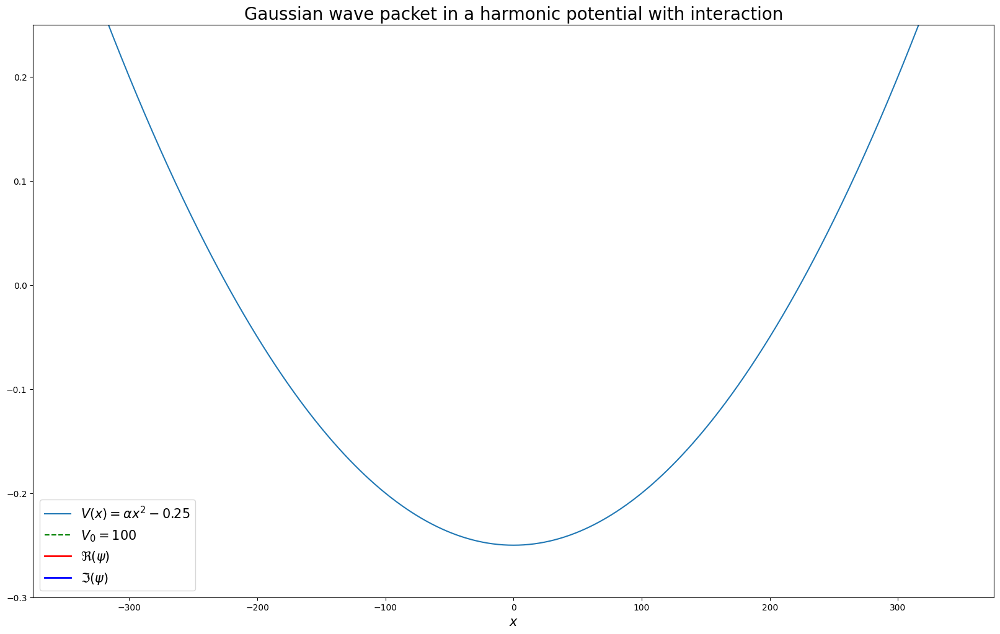

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

def integral(f, dx, axis=0):
    """This function allows us to approximate integrals in discrete space"""
    return np.sum(f * dx, axis=axis)

def initialize_wave(N_grid, L, alpha, V0, x0, k0, sigma):
    x = np.linspace(-L/2, L/2, N_grid + 1)  # grid of points centered around 0
    dx = x[1] - x[0]  # grid point spacing

    # Initial wave function
    psi0 = np.exp(-1/2 * (x[1:-1] - x0)**2 / sigma**2) * np.exp(1j * k0 * x[1:-1])

    # Normalize the initial state
    norm = integral(np.abs(psi0)**2, dx)
    psi0 = psi0 / np.sqrt(norm)

    # Kinetic energy
    T = -1/2 * 1/dx**2 * (np.diag(-2*np.ones(N_grid-1)) + np.diag(np.ones(N_grid-2), 1) + np.diag(np.ones(N_grid-2), -1))

    # Harmonic potential as a flat array, shifted down to center at (0, -0.25)
    V_flat = alpha * x[1:-1]**2 - 0.25

    # Potential energy as a diagonal matrix
    V = np.diag(V_flat)

    # Hamiltonian
    H = T + V

    return x, dx, psi0, H, V_flat

def solve_eigen(H, dx, psi0, N_grid):
    # Get eigenvalues and eigenvectors and normalize
    E, psi = np.linalg.eigh(H)
    psi = psi.T
    norm = integral(np.abs(psi)**2, dx)
    psi = psi / np.sqrt(norm)

    # Get expansion coefficients
    c_n = np.zeros_like(psi[0], dtype=complex)
    for j in range(0, N_grid-1):
        c_n[j] = integral(np.conj(psi[j]) * psi0, dx)

    return E, psi, c_n

def Psi(t, psi, c_n, E):
    return psi.T @ (c_n * np.exp(-1j * E * t))

def animate_wave(N_grid, L, alpha, V0, x0, k0, sigma, t):
    x, dx, psi0, H, V_flat = initialize_wave(N_grid, L, alpha, V0, x0, k0, sigma)
    E, psi, c_n = solve_eigen(H, dx, psi0, N_grid)

    fig = plt.figure(figsize=(20, 12))
    ax = plt.axes(xlim=(-L/2, L/2), ylim=(-0.3, 0.25))
    ax.plot(x[1:-1], V_flat, label='$V(x) = \\alpha x^2 - 0.25$')
    ax.axhline(V0, color='green', linestyle='--', label='$V_0 = 100$')
    ax.set_title('Gaussian wave packet in a harmonic potential with interaction', fontsize=20)
    line1, = ax.plot(x[1:-1], np.zeros(N_grid-1), lw=2, color="red", label='$\\Re(\\psi)$')
    line2, = ax.plot(x[1:-1], np.zeros(N_grid-1), lw=2, color="blue", label='$\\Im(\\psi)$')
    ax.legend(fontsize=15)
    ax.set_xlabel('$x$', fontsize=15)

    def animate(t):
        y1 = np.real(Psi(t, psi, c_n, E))
        y2 = np.imag(Psi(t, psi, c_n, E))
        line1.set_data(x[1:-1], y1)
        line2.set_data(x[1:-1], y2)
        return line1, line2,

    def init():
        line1.set_data([], [])
        line2.set_data([], [])
        return line1, line2,

    ani = FuncAnimation(fig, animate, frames=len(t), init_func=init, interval=20, blit=False)

    return ani

# Parameters
N_grid = 750
L = 750
alpha = 0.000005  # Strength of the harmonic potential
V0 = 100
x0 = 100
k0 = 0.4
sigma = 15
t = np.linspace(0, 1000, 500)

# Run animation
ani = animate_wave(N_grid, L, alpha, V0, x0, k0, sigma, t)
HTML(ani.to_html5_video())


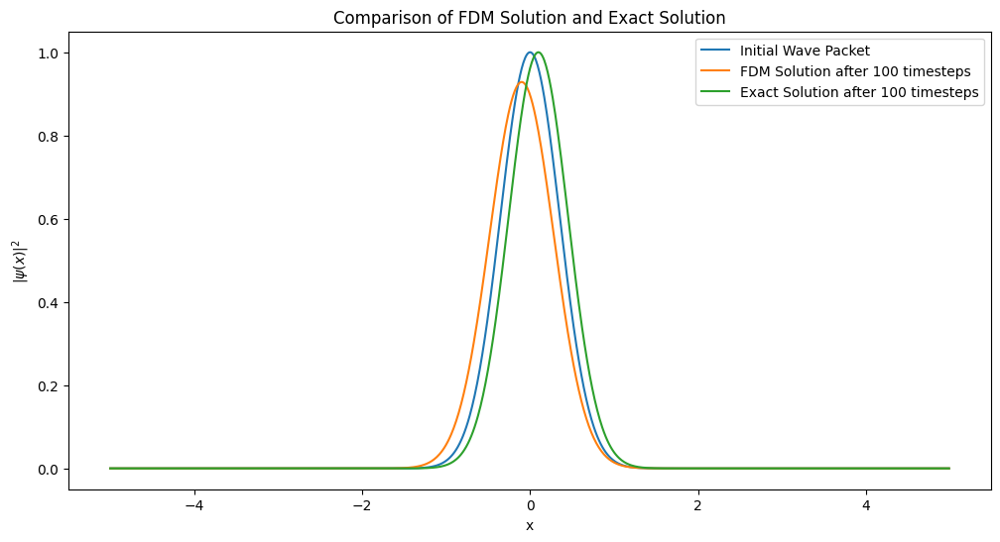

In [9]:
import numpy as np
import matplotlib.pyplot as plt

hbar = 1.0
m = 1.0
dx = 0.01  # 더 작은 공간 간격
dt = 0.001  # 더 작은 시간 간격
x = np.arange(-5, 5, dx)
n = len(x)

def initial_wave_packet(x, x0, k0, sigma):
    return np.exp(-(x - x0)**2 / (2 * sigma**2)) * np.exp(1j * k0 * x)

x0 = 0.0
k0 = 1.0
sigma = 0.5
psi_0 = initial_wave_packet(x, x0, k0, sigma)

V = np.zeros_like(x)

H = np.zeros((n, n), dtype=complex)
for i in range(1, n-1):
    H[i, i] = -2.0
    H[i, i+1] = H[i, i-1] = 1.0
H *= -hbar**2 / (2 * m * dx**2)
H += np.diag(V)

A = np.identity(n) - 1j * dt / (2 * hbar) * H
B = np.identity(n) + 1j * dt / (2 * hbar) * H

def time_step(psi, A, B):
    return np.linalg.solve(A, np.dot(B, psi))

timesteps = 100
psi = psi_0.copy()

time_array = np.arange(0, timesteps*dt, dt)
psi_exact = np.zeros((len(time_array), len(x)), dtype=complex)

for i, t in enumerate(time_array):
    psi_exact[i] = initial_wave_packet(x, x0 + hbar*k0/m * t, k0, sigma)

for _ in range(timesteps):
    psi = time_step(psi, A, B)

plt.figure(figsize=(12, 6))
plt.plot(x, np.abs(psi_0)**2, label='Initial Wave Packet')
plt.plot(x, np.abs(psi)**2, label='FDM Solution after {} timesteps'.format(timesteps))
plt.plot(x, np.abs(psi_exact[-1])**2, label='Exact Solution after {} timesteps'.format(timesteps))
plt.xlabel('x')
plt.ylabel('$|\psi(x)|^2$')
plt.legend()
plt.title('Comparison of FDM Solution and Exact Solution')
plt.show()


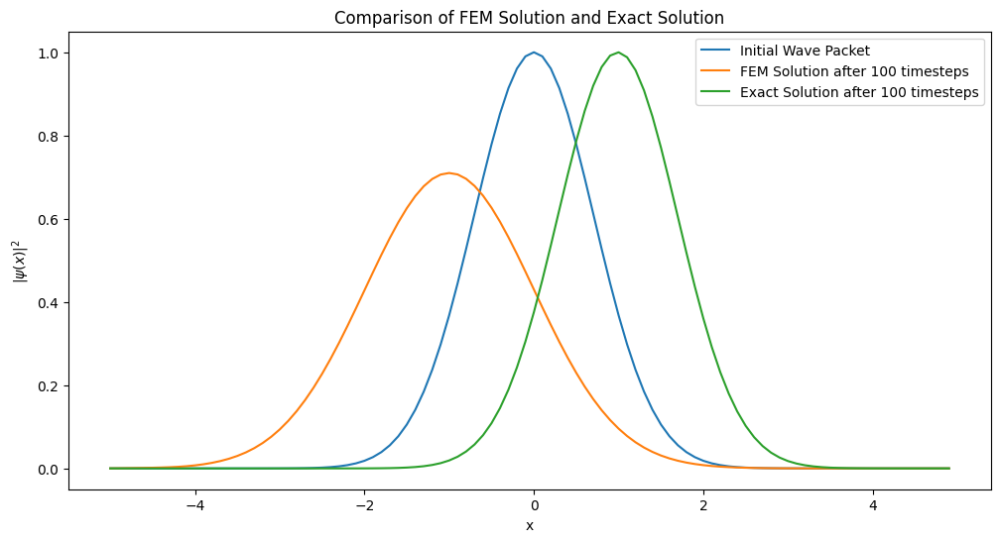

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.sparse import diags
from scipy.sparse.linalg import spsolve

hbar = 1.0
m = 1.0
dx = 0.1
dt = 0.01
x = np.arange(-5, 5, dx)
n = len(x)

def initial_wave_packet(x, x0, k0, sigma):
    return np.exp(-(x - x0)**2 / (2 * sigma**2)) * np.exp(1j * k0 * x)

x0 = 0.0
k0 = 1.0
sigma = 1.0
psi_0 = initial_wave_packet(x, x0, k0, sigma)

V = np.zeros_like(x)

main_diag = -2.0 * np.ones(n)
off_diag = 1.0 * np.ones(n-1)
H = diags([main_diag, off_diag, off_diag], [0, -1, 1], format='csr')
H *= -hbar**2 / (2 * m * dx**2)
H += diags(V, 0, format='csr')

A = diags([1] * n, 0) - 1j * dt / (2 * hbar) * H
B = diags([1] * n, 0) + 1j * dt / (2 * hbar) * H

def time_step(psi, A, B):
    return spsolve(A, B.dot(psi))

timesteps = 100
psi = psi_0.copy()

time_array = np.arange(0, timesteps*dt, dt)
psi_exact = np.zeros((len(time_array), len(x)), dtype=complex)

for i, t in enumerate(time_array):
    psi_exact[i] = initial_wave_packet(x, x0 + hbar*k0/m * t, k0, sigma)

for _ in range(timesteps):
    psi = time_step(psi, A, B)

plt.figure(figsize=(12, 6))
plt.plot(x, np.abs(psi_0)**2, label='Initial Wave Packet')
plt.plot(x, np.abs(psi)**2, label='FEM Solution after {} timesteps'.format(timesteps))
plt.plot(x, np.abs(psi_exact[-1])**2, label='Exact Solution after {} timesteps'.format(timesteps))
plt.xlabel('x')
plt.ylabel('$|\psi(x)|^2$')
plt.legend()
plt.title('Comparison of FEM Solution and Exact Solution')
plt.show()

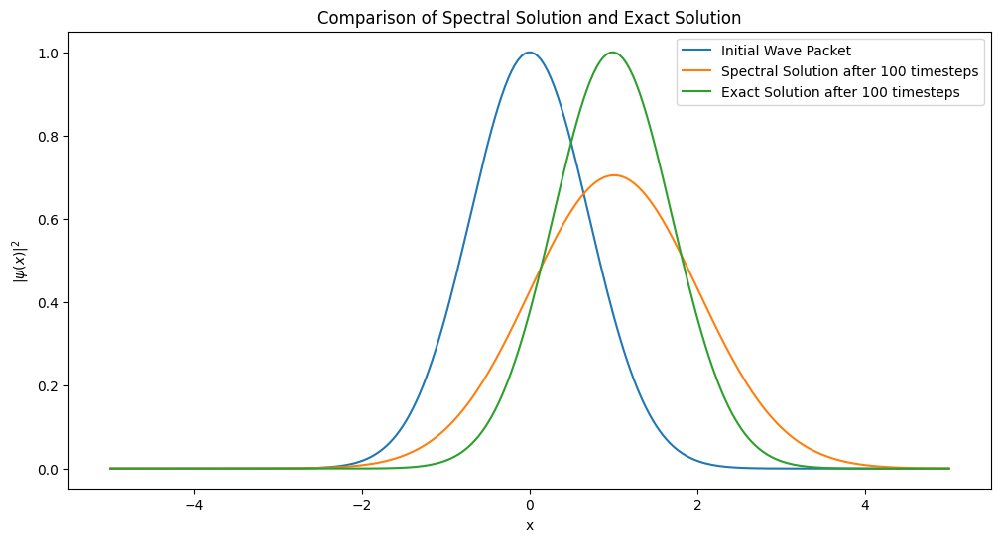

In [13]:
import numpy as np
import matplotlib.pyplot as plt

hbar = 1.0
m = 1.0
L = 10.0
N = 256
dx = L / N
dt = 0.01

x = np.linspace(-L/2, L/2, N)
k = 2 * np.pi * np.fft.fftfreq(N, d=dx)

def initial_wave_packet(x, x0, k0, sigma):
    return np.exp(-(x - x0)**2 / (2 * sigma**2)) * np.exp(1j * k0 * x)

x0 = 0.0
k0 = 1.0
sigma = 1.0
psi_0 = initial_wave_packet(x, x0, k0, sigma)

V = np.zeros_like(x)

def time_step_spectral(psi, V, k, dt, hbar, m):
    psi_k = np.fft.fft(psi)
    psi_k *= np.exp(-1j * hbar * k**2 / (2 * m) * dt)
    psi_x = np.fft.ifft(psi_k)
    psi_x *= np.exp(-1j * V * dt / hbar)
    return psi_x

timesteps = 100
psi = psi_0.copy()

time_array = np.arange(0, timesteps*dt, dt)
psi_exact = np.zeros((len(time_array), len(x)), dtype=complex)

for i, t in enumerate(time_array):
    psi_exact[i] = initial_wave_packet(x, x0 + hbar*k0/m * t, k0, sigma)

for _ in range(timesteps):
    psi = time_step_spectral(psi, V, k, dt, hbar, m)

plt.figure(figsize=(12, 6))
plt.plot(x, np.abs(psi_0)**2, label='Initial Wave Packet')
plt.plot(x, np.abs(psi)**2, label='Spectral Solution after {} timesteps'.format(timesteps))
plt.plot(x, np.abs(psi_exact[-1])**2, label='Exact Solution after {} timesteps'.format(timesteps))
plt.xlabel('x')
plt.ylabel('$|\psi(x)|^2$')
plt.legend()
plt.title('Comparison of Spectral Solution and Exact Solution')
plt.show()
